In [8]:
import os
import matplotlib.pyplot as plt
import h5py
from pathlib import Path
import pixel_counter
import numpy as np
import pandas as pd

In [14]:
data_folderes = ['/diskmnt/b/makov/robotom/74f73e80-3048-4b86-b67b-80b7d631bb85',]
df_number = 0
df = Path(data_folderes[df_number]).glob('tomo_rec.*.h5')
df=list(df)[0]
data = h5py.File(df, 'r')['Reconstruction']
img2d = data[40, 510:1190, 400:1060][150:500, 150:500]

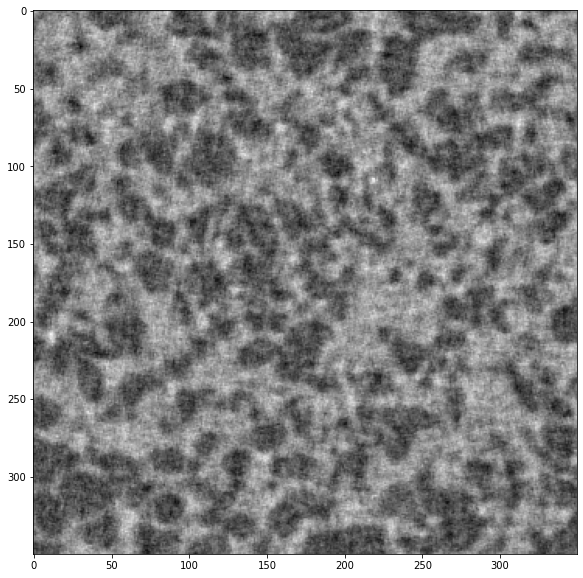

In [19]:
fig, ax = plt.subplots(figsize=(10,10))
ax.imshow(img2d, cmap="gray")

In [20]:
img2d_neighbours = pixel_counter.count_neighbor_average_array(img2d)

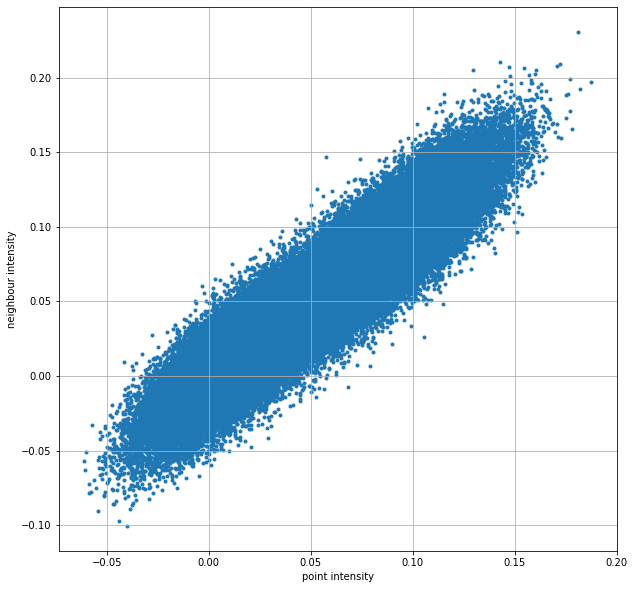

In [22]:
fig, ax = plt.subplots(figsize=(10,10))
ax.scatter(x=np.concatenate(img2d_neighbours), y=np.concatenate(img2d), marker='.')
ax.set_xlabel("point intensity")
ax.set_ylabel("neighbour intensity")
ax.grid()

In [23]:

import h5py
h5f = h5py.File('sample.h5', 'w')
h5f.create_dataset('layer1', data=img2d)

<HDF5 dataset "layer1": shape (350, 350), type "<f4">